# Necessary imports and configurations

In [11]:
import os
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from PIL import Image
from collections import defaultdict
from sklearn.model_selection import train_test_split
from torch.utils.data import Dataset, DataLoader
import torch
from torchvision import transforms
from tqdm import tqdm
import shutil
from sklearn.model_selection import train_test_split
import albumentations as A
from albumentations.pytorch import ToTensorV2
import cv2

ModuleNotFoundError: No module named 'albumentations'

# Data Analysis

## Data Distribution per class

In [6]:
dict_class = defaultdict()
dict_class['car'] = len(os.listdir(r'C:\Users\Amit\Desktop\RT_PROJECT\dataset_post_cleaning\car'))
dict_class['no_car'] = len(os.listdir(r'C:\Users\Amit\Desktop\RT_PROJECT\dataset_post_cleaning\no_car'))

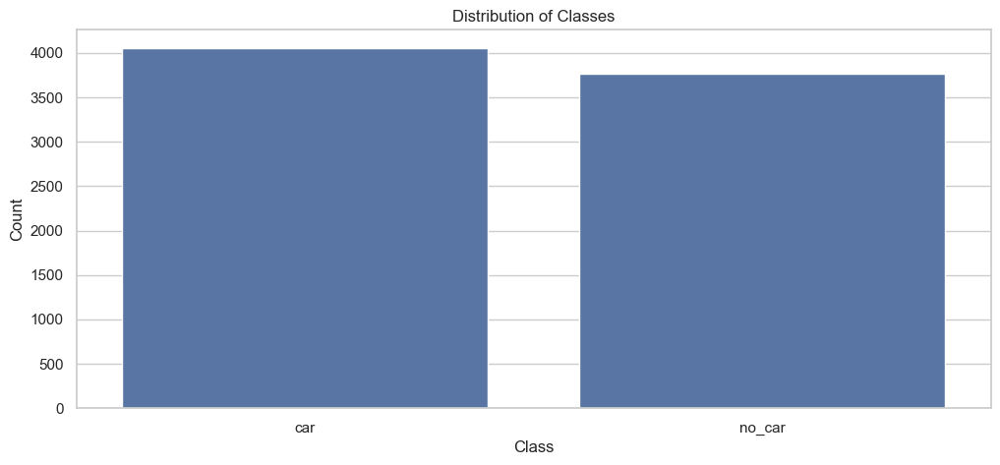

In [7]:
df = pd.DataFrame(list(dict_class.items()), columns=['Class', 'Count'])
# Plot the distribution using seaborn barplot
plt.figure(figsize=(12, 5))
sns.set_theme(style="whitegrid")
sns.barplot(data=df, x='Class', y='Count')
plt.title('Distribution of Classes')
plt.xlabel('Class')
plt.ylabel('Count')
plt.show()

As we can see here,our classes aren't evenly balanced, so we're using data augmentation to fix that.

Data Augmentation

In [9]:
folder_path = r'C:\Users\Amit\Desktop\RT_PROJECT\dataset_post_cleaning\no_car'

# Define an empty list to store augmented images
augmented_images = []

# Define augmentation pipeline
transform = A.Compose([
    A.HorizontalFlip(p=1.0),
    A.RandomBrightnessContrast(p=1.0),
])

# Apply augmentation only to the images in the "no_car" folder
for filename in os.listdir(folder_path):
    image_path = os.path.join(folder_path, filename)
    image = cv2.imread(image_path)  # Read the image
    # Apply transformation
    transformed = transform(image=image)
    augmented_image = transformed["image"]
    augmented_image_path = os.path.join(folder_path, f"augmented_{filename}")
    cv2.imwrite(augmented_image_path, augmented_image)

NameError: name 'A' is not defined

In [5]:
dict_class = defaultdict()
dict_class['car'] = len(os.listdir('M:/Real-time_Parking_Spot_Detection/dataset_post_cleaning/car'))
dict_class['no_car'] = len(os.listdir('M:/Real-time_Parking_Spot_Detection/dataset_post_cleaning/no_car'))

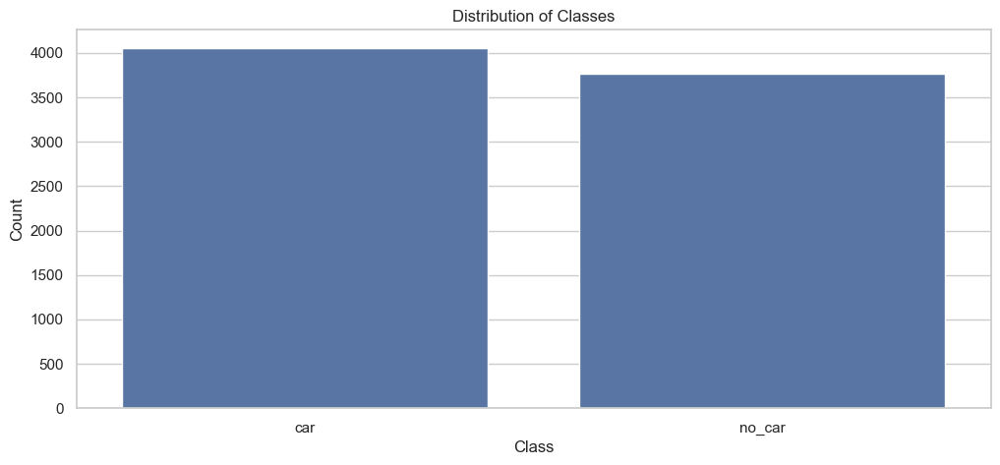

In [6]:
df = pd.DataFrame(list(dict_class.items()), columns=['Class', 'Count'])
# Plot the distribution using seaborn barplot
plt.figure(figsize=(12, 5))
sns.set_theme(style="whitegrid")
sns.barplot(data=df, x='Class', y='Count')
plt.title('Distribution of Classes')
plt.xlabel('Class')
plt.ylabel('Count')
plt.show()

## Number of pixels

In [7]:
def get_image_dimensions(folder_path):
    image_dimensions = []
    for root, dirs, files in os.walk(folder_path):
        for file in files:
            if file.lower().endswith(('.png', '.jpg', '.jpeg', '.gif')):
                file_path = os.path.join(root, file)
                with Image.open(file_path) as img:
                    width, height = img.size
                    image_dimensions.append((width, height))
    return image_dimensions

main_folder_path = 'M:/Real-time_Parking_Spot_Detection/dataset_post_cleaning/'
dimension_list_total = []
subfolders = os.listdir(main_folder_path)
for subfolder in subfolders:
    subfolder_path = os.path.join(main_folder_path, subfolder)
    dimensions_list = get_image_dimensions(subfolder_path)
    dimension_list_total += dimensions_list

df = pd.DataFrame(dimension_list_total, columns=['Width', 'Height'])
print(df)
print(df.describe())

      Width  Height
0        75      29
1        69      29
2        72      29
3        72      28
4        75      29
...     ...     ...
7816     70      28
7817     69      30
7818     70      28
7819     69      29
7820     68      29

[7821 rows x 2 columns]
             Width       Height
count  7821.000000  7821.000000
mean     69.625751    29.310191
std       3.091850     1.708167
min      60.000000    26.000000
25%      68.000000    28.000000
50%      70.000000    29.000000
75%      71.000000    30.000000
max      81.000000    37.000000


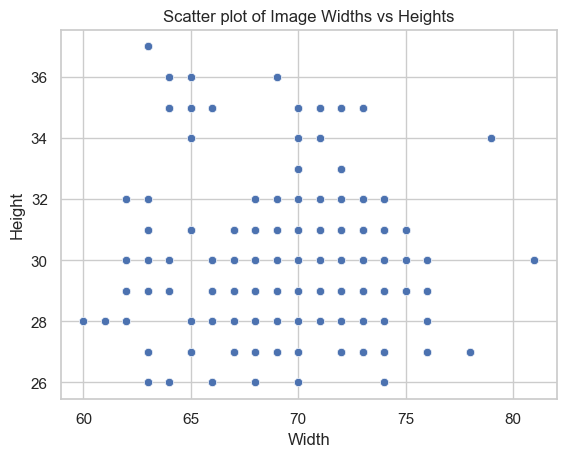

In [8]:
# Unzip the dimensions into separate lists
widths, heights = zip(*dimension_list_total)
# Create scatter plot using seaborn
sns.scatterplot(x=widths, y=heights)
plt.title('Scatter plot of Image Widths vs Heights')
plt.xlabel('Width')
plt.ylabel('Height')
plt.show()

# Preparing dataset

## Creating Dataframe

In [9]:
list_cars = os.listdir('M:/Real-time_Parking_Spot_Detection/dataset_post_cleaning/car')
list_no_cars = os.listdir('M:/Real-time_Parking_Spot_Detection/dataset_post_cleaning/no_car')
df_car = pd.DataFrame({'image_path': list_cars, 'class': 1})
df_no_car =  pd.DataFrame({'image_path': list_no_cars, 'class': 0})

In [10]:
df_car['image_path'] = 'M:/Real-time_Parking_Spot_Detection/dataset_post_cleaning/car/' + df_car['image_path']
df_car

,image_path,class
0,M:/Real-time_Parking_Spot_Detection/dataset_po...,1
1,M:/Real-time_Parking_Spot_Detection/dataset_po...,1
2,M:/Real-time_Parking_Spot_Detection/dataset_po...,1
3,M:/Real-time_Parking_Spot_Detection/dataset_po...,1
4,M:/Real-time_Parking_Spot_Detection/dataset_po...,1
...,...,...
4054,M:/Real-time_Parking_Spot_Detection/dataset_po...,1
4055,M:/Real-time_Parking_Spot_Detection/dataset_po...,1
4056,M:/Real-time_Parking_Spot_Detection/dataset_po...,1
4057,M:/Real-time_Parking_Spot_Detection/dataset_po...,1


In [11]:
df_no_car['image_path'] = 'M:/Real-time_Parking_Spot_Detection/dataset_post_cleaning/no_car/' + df_no_car['image_path']
df_no_car

,image_path,class
0,M:/Real-time_Parking_Spot_Detection/dataset_po...,0
1,M:/Real-time_Parking_Spot_Detection/dataset_po...,0
2,M:/Real-time_Parking_Spot_Detection/dataset_po...,0
3,M:/Real-time_Parking_Spot_Detection/dataset_po...,0
4,M:/Real-time_Parking_Spot_Detection/dataset_po...,0
...,...,...
3757,M:/Real-time_Parking_Spot_Detection/dataset_po...,0
3758,M:/Real-time_Parking_Spot_Detection/dataset_po...,0
3759,M:/Real-time_Parking_Spot_Detection/dataset_po...,0
3760,M:/Real-time_Parking_Spot_Detection/dataset_po...,0


In [12]:
merged_df = pd.concat([df_car, df_no_car], ignore_index=True)
merged_df

,image_path,class
0,M:/Real-time_Parking_Spot_Detection/dataset_po...,1
1,M:/Real-time_Parking_Spot_Detection/dataset_po...,1
2,M:/Real-time_Parking_Spot_Detection/dataset_po...,1
3,M:/Real-time_Parking_Spot_Detection/dataset_po...,1
4,M:/Real-time_Parking_Spot_Detection/dataset_po...,1
...,...,...
7816,M:/Real-time_Parking_Spot_Detection/dataset_po...,0
7817,M:/Real-time_Parking_Spot_Detection/dataset_po...,0
7818,M:/Real-time_Parking_Spot_Detection/dataset_po...,0
7819,M:/Real-time_Parking_Spot_Detection/dataset_po...,0


## Creating train set, test set and validation set

In [13]:
# First, split data into train and test sets
train_images, test_images, train_labels, test_labels = train_test_split(merged_df['image_path'], merged_df['class'], test_size=0.2, random_state=42)

# Then, split the training data further into train and validation sets
train_images, valid_images, train_labels, valid_labels = train_test_split(train_images, train_labels, test_size=0.1, random_state=42)

## Creating Custom Dataset

In [14]:
class ImagesDataset(Dataset):
    def __init__(self, images, labels, width=70, height=32):
        self.images = images
        self.labels = labels
        self.transform = transforms.Compose([
            transforms.Resize((height, width)),
            transforms.ToTensor()
        ])

    def __len__(self):
        return len(self.images)

    def __getitem__(self, index):
        try:
            image = Image.open(self.images[index])
            label = self.labels[index]
            resized_image = self.transform(image)
            return resized_image, label

        except Exception as e:
            print(f"Error at index {index}: {str(e)}")
            raise

In [15]:
train_images = train_images.reset_index(drop=True)
test_images =  test_images.reset_index(drop=True)
valid_images = valid_images.reset_index(drop=True)
train_labels = train_labels.reset_index(drop=True)
test_labels = test_labels.reset_index(drop=True)
valid_labels = valid_labels.reset_index(drop=True)

In [16]:
train_dataset = ImagesDataset(train_images, train_labels)
validation_dataset = ImagesDataset(valid_images, valid_labels)
test_dataset = ImagesDataset(test_images, test_labels)
batch_size = 64
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
valid_loader = DataLoader(validation_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=True)

# Fine-tuning & Evaluation

## Training

In [17]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


In [18]:
from torchvision.models import resnet50
from torchvision.models.resnet import ResNet50_Weights

model = resnet50(weights=ResNet50_Weights.IMAGENET1K_V1)

In [19]:
EPOCHS = 20
loss_fn = torch.nn.BCEWithLogitsLoss() #binary cross entropy with sigmoid, so no need to use sigmoid in the model
lr = 0.001
optimizer = torch.optim.SGD(model.parameters(), lr=lr)
for params in model.parameters():
  params.requires_grad_ = False

#add a new final layer
nr_filters = model.fc.in_features  #number of input features of last layer
model.fc = torch.nn.Linear(nr_filters, 1)

model = model.to(device)

In [20]:
losses = []
val_losses = []
epoch_train_losses = []
epoch_valid_losses = []

for epoch in range(EPOCHS):
  epoch_loss = 0
  for i ,data in tqdm(enumerate(train_loader), total = len(train_loader)): #iterate ove batches
    images , labels = data
    images = images.to(device)
    labels = labels.unsqueeze(1).float()
    labels = labels.to(device)
    output = model(images)
    model.train()
    loss = loss_fn(output, labels)
    loss.backward()
    optimizer.step()
    optimizer.zero_grad()
    epoch_loss += loss/len(train_loader)
    losses.append(loss)

  epoch_train_losses.append(epoch_loss)
  print('\nEpoch : {}, train loss : {}'.format(epoch+1,epoch_loss))

  #validation doesnt requires gradient
  with torch.no_grad():
    cum_loss = 0
    for images, labels in valid_loader:
      images = images.to(device)
      labels = labels.unsqueeze(1).float() #convert target to same nn output shape
      labels = labels.to(device)

      #model to eval mode
      model.eval()

      output = model(images)
      val_loss = loss_fn(output,labels)
      cum_loss += loss/len(valid_loader)
      val_losses.append(val_loss.item())


    epoch_valid_losses.append(cum_loss)
    print('Epoch : {}, val loss : {}'.format(epoch+1,cum_loss))

    best_loss = min(epoch_valid_losses)

    #save best model
    if cum_loss <= best_loss:
      best_model_wts = model.state_dict()

100%|██████████| 88/88 [00:09<00:00,  9.17it/s]



Epoch : 1, train loss : 0.5991249084472656
Epoch : 1, val loss : 0.49581649899482727


100%|██████████| 88/88 [00:07<00:00, 11.04it/s]



Epoch : 2, train loss : 0.40025895833969116
Epoch : 2, val loss : 0.3447122275829315


100%|██████████| 88/88 [00:08<00:00, 10.43it/s]



Epoch : 3, train loss : 0.28217869997024536
Epoch : 3, val loss : 0.23223935067653656


100%|██████████| 88/88 [00:08<00:00, 10.69it/s]



Epoch : 4, train loss : 0.2058987021446228
Epoch : 4, val loss : 0.14836983382701874


100%|██████████| 88/88 [00:08<00:00, 10.08it/s]



Epoch : 5, train loss : 0.15098966658115387
Epoch : 5, val loss : 0.1290310174226761


100%|██████████| 88/88 [00:08<00:00,  9.93it/s]



Epoch : 6, train loss : 0.1146925538778305
Epoch : 6, val loss : 0.10759413987398148


100%|██████████| 88/88 [00:10<00:00,  8.11it/s]



Epoch : 7, train loss : 0.0904625952243805
Epoch : 7, val loss : 0.08973949402570724


100%|██████████| 88/88 [00:10<00:00,  8.72it/s]



Epoch : 8, train loss : 0.07095468044281006
Epoch : 8, val loss : 0.046377409249544144


100%|██████████| 88/88 [00:10<00:00,  8.63it/s]



Epoch : 9, train loss : 0.059361547231674194
Epoch : 9, val loss : 0.04608497396111488


100%|██████████| 88/88 [00:09<00:00,  9.21it/s]



Epoch : 10, train loss : 0.049578629434108734
Epoch : 10, val loss : 0.035309430211782455


100%|██████████| 88/88 [00:10<00:00,  8.66it/s]



Epoch : 11, train loss : 0.04240977764129639
Epoch : 11, val loss : 0.023767536506056786


100%|██████████| 88/88 [00:10<00:00,  8.54it/s]



Epoch : 12, train loss : 0.03725605830550194
Epoch : 12, val loss : 0.07017522305250168


100%|██████████| 88/88 [00:10<00:00,  8.69it/s]



Epoch : 13, train loss : 0.032309193164110184
Epoch : 13, val loss : 0.025464685633778572


100%|██████████| 88/88 [00:10<00:00,  8.36it/s]



Epoch : 14, train loss : 0.027089448645710945
Epoch : 14, val loss : 0.018313957378268242


100%|██████████| 88/88 [00:10<00:00,  8.32it/s]



Epoch : 15, train loss : 0.025341792032122612
Epoch : 15, val loss : 0.01833338290452957


100%|██████████| 88/88 [00:11<00:00,  7.41it/s]



Epoch : 16, train loss : 0.020762557163834572
Epoch : 16, val loss : 0.017811959609389305


100%|██████████| 88/88 [00:12<00:00,  7.15it/s]



Epoch : 17, train loss : 0.02124965935945511
Epoch : 17, val loss : 0.012713856063783169


100%|██████████| 88/88 [00:11<00:00,  7.35it/s]



Epoch : 18, train loss : 0.019714519381523132
Epoch : 18, val loss : 0.010220912285149097


100%|██████████| 88/88 [00:12<00:00,  7.12it/s]



Epoch : 19, train loss : 0.017182443290948868
Epoch : 19, val loss : 0.02529127709567547


100%|██████████| 88/88 [00:13<00:00,  6.58it/s]



Epoch : 20, train loss : 0.01613403856754303
Epoch : 20, val loss : 0.017071126028895378


## Evaluation

In [27]:
from sklearn.metrics import f1_score, precision_score, recall_score

with torch.no_grad():
    cum_loss = 0
    correct_predictions = 0
    total_samples = 0
    all_labels = []
    all_predictions = []
    for images, labels in test_loader:
        images = images.to(device)
        labels = labels.unsqueeze(1).float() # Convert target to the same shape as the model output
        labels = labels.to(device)

        # Set the model to evaluation mode
        model.eval()

        # Forward pass
        output = model(images)

        # Apply sigmoid to the output
        sigmoid_output = torch.sigmoid(output)

        # Round the sigmoid output to get binary predictions (0 or 1)
        binary_predictions = torch.round(sigmoid_output)

        # Compute accuracy
        correct_predictions += (binary_predictions == labels).sum().item()
        total_samples += labels.size(0)

         # Store all labels and predictions for precision and recall calculation
        all_labels.extend(labels.view(-1).cpu().numpy())
        all_predictions.extend(binary_predictions.view(-1).cpu().numpy())

# Compute accuracy
accuracy = correct_predictions / total_samples
print("Accuracy:", accuracy)

# Compute precision and recall
precision = precision_score(all_labels, all_predictions)
recall = recall_score(all_labels, all_predictions)
f1 = f1_score(all_labels, all_predictions)
print("F1 Score:", f1)
print("Precision:", precision)
print("Recall:", recall)

Accuracy: 0.9980830670926517


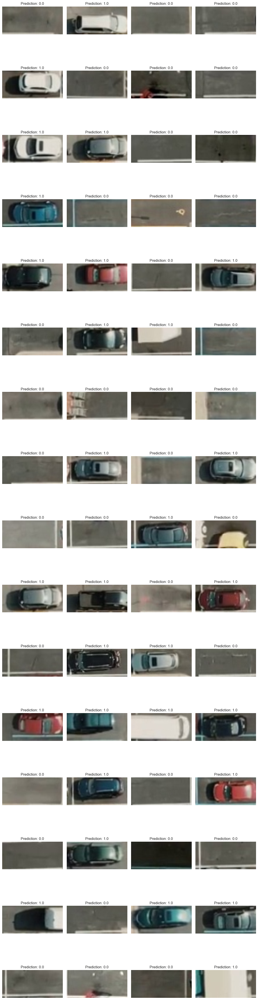

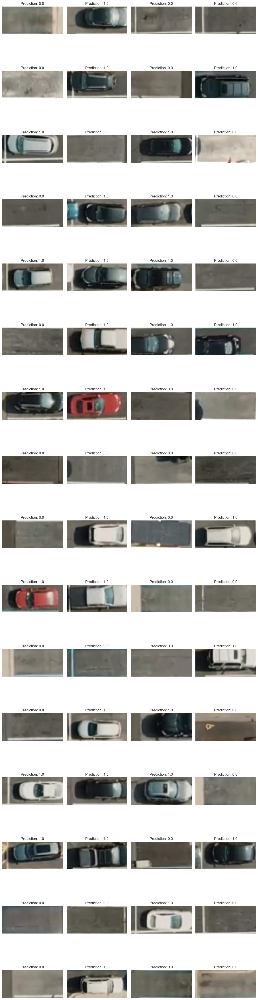

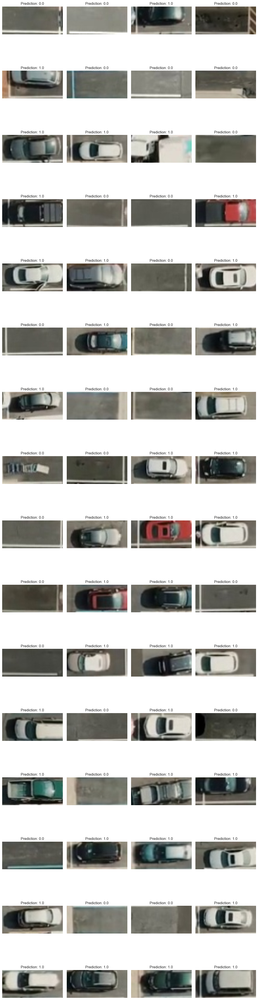

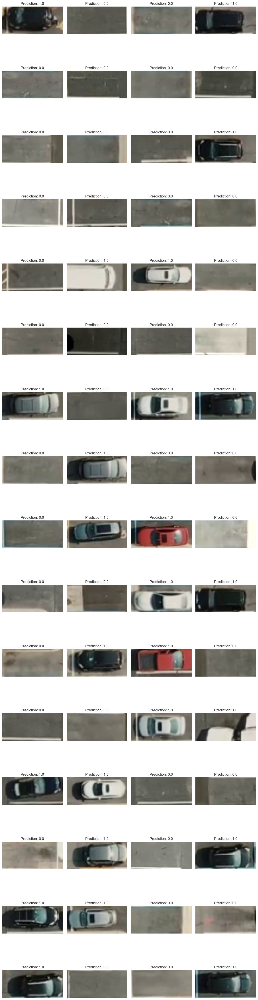

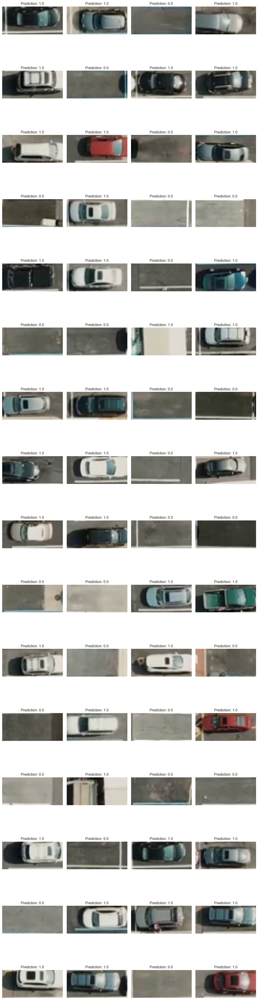

...

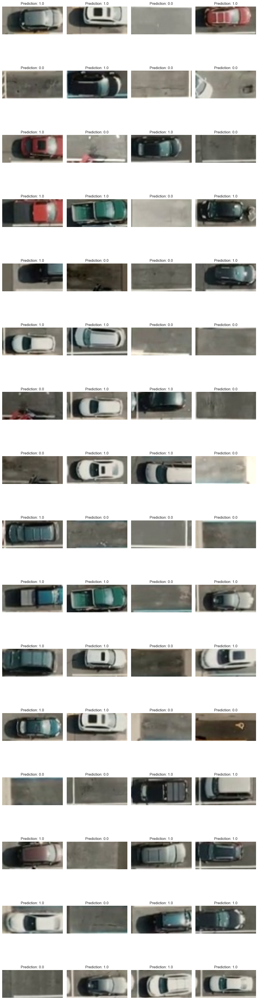

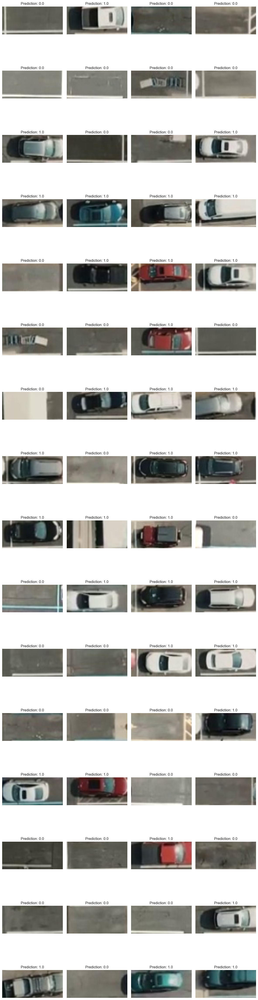

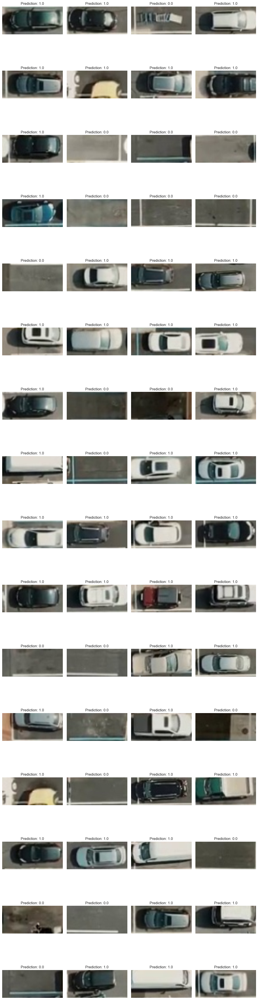

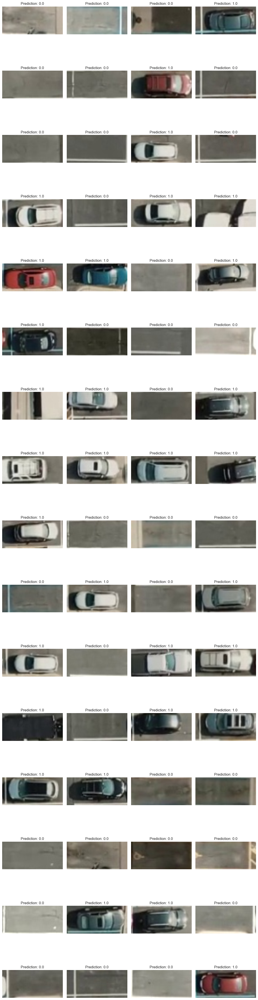

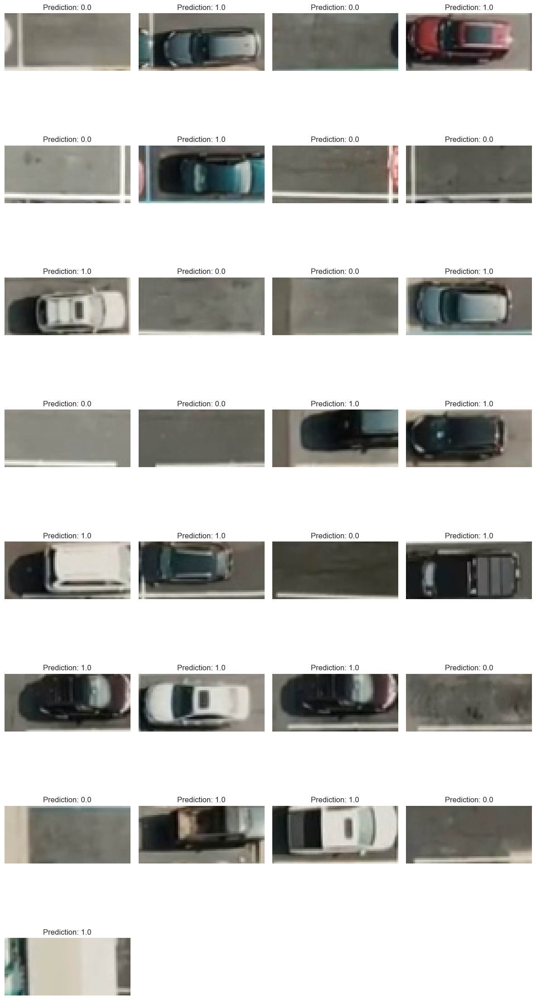

In [28]:
# Set model to evaluation mode
model.eval()

# Define the maximum number of images to display per row
max_images_per_row = 4

# Iterate over each batch in the test loader
for batch_idx, (images, _) in enumerate(test_loader):
    # Calculate the number of rows needed for the subplot
    num_rows = (len(images) - 1) // max_images_per_row + 1

    # Create a new figure for each batch
    fig = plt.figure(figsize=(12, 3 * num_rows))  # Adjust height based on the number of rows

    # Move images to the appropriate device
    images = images.to(device)

    with torch.no_grad():
        # Forward pass
        output = model(images)

    # Apply sigmoid to the output
    sigmoid_output = torch.sigmoid(output)
    binary_predictions = torch.round(sigmoid_output)

    # Convert predictions to CPU and numpy array
    binary_predictions = binary_predictions.cpu().numpy()

    # Track the total number of images plotted
    num_images_plotted = 0

    # Iterate over each image in the batch
    for i in range(len(images)):
        # Convert image to numpy array and transpose
        image_np = images[i].cpu().numpy().squeeze().transpose((1, 2, 0))

        # Plot the image in a subplot
        ax = fig.add_subplot(num_rows, max_images_per_row, num_images_plotted + 1)
        ax.imshow(image_np)
        ax.set_title(f"Prediction: {binary_predictions[i][0]}")
        ax.axis('off')

        # Increment the number of images plotted
        num_images_plotted += 1

        # Break the loop if the maximum number of images has been plotted
        if num_images_plotted >= len(test_loader.dataset):
            break

    # Adjust layout and display the figure for the current batch
    plt.tight_layout()
    plt.show()

    # Break the loop if the maximum number of images has been plotted
    if num_images_plotted >= len(test_loader.dataset):
        break

## Saving model

In [29]:
torch.save(model.state_dict(), 'final_resnet_optimized.pt')